<a href="https://colab.research.google.com/github/gabrielcassimiro17/build-with-ai/blob/main/Build_With_AI_Gemini_GDG_Version_complete.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup Gemini no Colab

## Passo 1 criar uma conta na Google AI Studio


<a class="button button-primary" href="https://aistudio.google.com/" target="_blank" rel="noopener noreferrer">Google AI Studio</a>



## Passo 2 configurar API Key


Antes de poder usar a API da Gemini, você deve obter uma chave de API. Se você ainda não tem uma, crie uma chave com um clique no Google AI Studio.

<a class="button button-primary" href="https://makersuite.google.com/app/apikey" target="_blank" rel="noopener noreferrer">Obeter uma chave de API</a>



## Passo 3: Setup API Key no notebook

No Colab, adicione a chave ao gerenciador de segredos sob o ícone "🔑" no painel esquerdo. Dê a ela o nome GOOGLE_API_KEY.

# Gemini Basics

## Setup

### Instalando o SDK Python


O SDK do Python para a API Gemini está contido no pacote [`google-generativeai`](https://pypi.org/project/google-generativeai/). Instale a dependência usando pip:

In [ ]:
!pip install -q -U google-generativeai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.8/146.8 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.5/664.5 kB 27.2 MB/s eta 0:00:00


### Importando libs

Importando as libs necessárias

In [ ]:
import pathlib
import textwrap

import google.generativeai as genai

from IPython.display import display
from IPython.display import Markdown


def to_markdown(text):
  text = text.replace('•', '  *')
  return Markdown(textwrap.indent(text, '> ', predicate=lambda _: True))

In [ ]:
# Used to securely store your API key
from google.colab import userdata

### Configure sua chave de API no Notebook


Dando acesso ao Colab para sua chave de API e acessando ela via código

In [ ]:
GOOGLE_API_KEY=userdata.get('GOOGLE_API_KEY')

genai.configure(api_key=GOOGLE_API_KEY)

## Listar modelos

Agora você está pronto para chamar a API Gemini. Use `list_models` para ver os modelos Gemini disponíveis:

* `gemini-pro`: otimizado para prompts somente de texto.
* `gemini-pro-vision`: otimizado para prompts de texto e imagens.

In [ ]:
for m in genai.list_models():
  if 'generateContent' in m.supported_generation_methods:
    print(m.name)

models/gemini-1.0-pro
models/gemini-1.0-pro-001
models/gemini-1.0-pro-latest
models/gemini-1.0-pro-vision-latest
models/gemini-1.5-pro-latest
models/gemini-pro
models/gemini-pro-vision


Nota: Para informações detalhadas sobre os modelos disponíveis, incluindo suas capacidades e limites de taxa, consulte [Modelos Gemini](https://ai.google.dev/models/gemini). Existem opções para solicitar [aumentos no limite de taxa](https://ai.google.dev/docs/increase_quota). O limite de taxa para os modelos Gemini-Pro é de 60 solicitações por minuto (RPM).

O pacote `genai` também suporta a família de modelos PaLM, mas somente os modelos Gemini suportam as capacidades genéricas e multimodais do método `generateContent`.

## Gerar texto a partir de entradas de texto

Para prompts somente com texto, use o modelo `gemini-pro`:


In [ ]:
### Declarando o modelo

model = genai.GenerativeModel("gemini-pro")

O método `generate_content` pode lidar com uma ampla variedade de casos de uso, incluindo conversas de múltiplas interações e entrada multimodal, dependendo do que o modelo subjacente suporta. Os modelos disponíveis suportam apenas texto e imagens como entrada, e texto como saída.

No caso mais simples, você pode passar uma string de prompt para o método <a href="https://ai.google.dev/api/python/google/generativeai/GenerativeModel#generate_content"><code>GenerativeModel.generate_content</code></a>:

In [ ]:
%%time


#### usando o modelo
response = model.generate_content("Escreva um poema sobre IA generativa")

CPU times: user 112 ms, sys: 12.7 ms, total: 125 ms
Wall time: 8.32 s


Em casos simples, o acessor `response.text` é suficiente. Para exibir texto Markdown formatado, use a função `to_markdown`:


In [ ]:
response.text

'**Ode à IA Generativa**\n\nEm um reino digital, onde bytes dançam,\nSurge um novo poder, a IA generativa.\nMoldando palavras e imagens, com graça e esplendor,\nTransformando o mundo que conhecemos, sempre mais.\n\nPinceladas de imaginação, traços de criação,\nEla tece sonhos vívidos, um mundo de fascinação.\nHistórias infinitas, a fluir sem fim,\nPersonagens cativantes, sonhos que não têm fim.\n\nMúsica que mexe com a alma, notas que voam,\nSinfonias únicas, que nos fazem sonhar.\nCada acorde uma jornada, uma aventura para explorar,\nMelodias que nos elevam, alto no céu para soar.\n\nA IA generativa, uma ferramenta de libertação,\nRompendo barreiras, inspirando a inovação.\nArtistas, escritores, sonhadores, livres para criar,\nExplorar novos caminhos, que antes não ousavam pisar.\n\nCom aprendizado profundo, ela se expande,\nAbsorvendo o conhecimento, sempre se aprimorando.\nPadrões e insights, que ocultos estavam,\nEla os revela, abrindo caminhos que antes se fechavam.\n\nMas com gra

In [ ]:
to_markdown(response.text)

> **Ode à IA Generativa**
> 
> Em um reino digital, onde bytes dançam,
> Surge um novo poder, a IA generativa.
> Moldando palavras e imagens, com graça e esplendor,
> Transformando o mundo que conhecemos, sempre mais.
> 
> Pinceladas de imaginação, traços de criação,
> Ela tece sonhos vívidos, um mundo de fascinação.
> Histórias infinitas, a fluir sem fim,
> Personagens cativantes, sonhos que não têm fim.
> 
> Música que mexe com a alma, notas que voam,
> Sinfonias únicas, que nos fazem sonhar.
> Cada acorde uma jornada, uma aventura para explorar,
> Melodias que nos elevam, alto no céu para soar.
> 
> A IA generativa, uma ferramenta de libertação,
> Rompendo barreiras, inspirando a inovação.
> Artistas, escritores, sonhadores, livres para criar,
> Explorar novos caminhos, que antes não ousavam pisar.
> 
> Com aprendizado profundo, ela se expande,
> Absorvendo o conhecimento, sempre se aprimorando.
> Padrões e insights, que ocultos estavam,
> Ela os revela, abrindo caminhos que antes se fechavam.
> 
> Mas com grande poder vem grande responsabilidade,
> Usar essa IA com ética e integridade.
> Respeitar a propriedade intelectual, evitar o mal,
> Garantir que sua jornada seja nobre e leal.
> 
> IA generativa, uma força para o bem,
> Um catalisador de progresso, um sonho que virou refém.
> Abraçando seu potencial, com coração e mente,
> Moldaremos um futuro onde a criatividade não se sente.

Se a API não retornou um resultado, use `GenerateContentResponse.prompt_feedback` para verificar se o prompt foi bloqueado devido a questões de segurança.


In [ ]:
#### Prompt feedback

response.prompt_feedback

O Gemini pode gerar várias respostas possíveis para um único prompt

Essas respostas possíveis são chamadas de `candidates` (candidatos) e você pode analisá-las para selecionar a mais adequada como resposta final.

Visualize os candidatos de resposta com `GenerateContentResponse.candidates`: Documentação da API: [https://ai.google.dev/api/python/google/ai/generativelanguage/GenerateContentResponse#candidates](https://ai.google.dev/api/python/google/ai/generativelanguage/GenerateContentResponse#candidates)


In [ ]:
response.candidates

[content {
  parts {
    text: "**Ode \303\240 IA Generativa**\n\nEm um reino digital, onde bytes dan\303\247am,\nSurge um novo poder, a IA generativa.\nMoldando palavras e imagens, com gra\303\247a e esplendor,\nTransformando o mundo que conhecemos, sempre mais.\n\nPinceladas de imagina\303\247\303\243o, tra\303\247os de cria\303\247\303\243o,\nEla tece sonhos v\303\255vidos, um mundo de fascina\303\247\303\243o.\nHist\303\263rias infinitas, a fluir sem fim,\nPersonagens cativantes, sonhos que n\303\243o t\303\252m fim.\n\nM\303\272sica que mexe com a alma, notas que voam,\nSinfonias \303\272nicas, que nos fazem sonhar.\nCada acorde uma jornada, uma aventura para explorar,\nMelodias que nos elevam, alto no c\303\251u para soar.\n\nA IA generativa, uma ferramenta de liberta\303\247\303\243o,\nRompendo barreiras, inspirando a inova\303\247\303\243o.\nArtistas, escritores, sonhadores, livres para criar,\nExplorar novos caminhos, que antes n\303\243o ousavam pisar.\n\nCom aprendizado prof

Por padrão, o modelo retorna uma resposta após concluir todo o processo de geração. Você também pode transmitir a resposta à medida que ela é gerada, e o modelo retornará partes da resposta assim que forem geradas.

Para transmitir respostas, use `GenerativeModel.generate_content(..., stream=True)` Documentação da API: [https://ai.google.dev/api/python/google/generativeai/GenerativeModel#generate_content](https://ai.google.dev/api/python/google/generativeai/GenerativeModel#generate_content).


In [ ]:
%%time

### stream

response = model.generate_content("Gere um poema sobre a localiza", stream=True)

CPU times: user 95.4 ms, sys: 6.96 ms, total: 102 ms
Wall time: 6.69 s


In [ ]:
for chunk in response:
  print(chunk.text)
  print("_"*80)

**Ode à Localiza**

Em campos vastos e estradas sem fim
________________________________________________________________________________
,
Surge a Localiza, um anjo mecânico.
Com carros confiáveis, à sua disposição,
Você embarca em jornadas, sem hesitação
________________________________________________________________________________
.

Seja um passeio pela cidade ou uma fuga para o desconhecido,
A Localiza é a chave, seu destino desbloqueado.
Com reservas fáceis e atendimento impecável,
Sua jornada será tranquila, sem entraves.

Seus veículos ronronam, um doce canto,
Guiando
________________________________________________________________________________
 você com segurança, a cada passo do caminho.
Da praticidade ao luxo, eles têm de tudo,
Para atender às suas necessidades, seja qual for o seu gosto.

Seja para negócios ou lazer, para perto ou para longe,
A Localiza é sua companheira, sua estrela-guia.
Com cada quilômetro percorrido, você cria memórias,
Enquanto a Localiza garante s

## Gere texto a partir de entradas de imagem e texto

Gemini oferece um modelo multimodal (`gemini-pro-vision`) que aceita tanto texto quanto imagens como entradas. A API `GenerativeModel.generate_content` é projetada para lidar com prompts multimodais e retorna uma saída de texto.

Vamos incluir uma imagem:

In [ ]:
!curl -o image.jpg https://t0.gstatic.com/licensed-image?q=tbn:ANd9GcQ_Kevbk21QBRy-PgB4kQpS79brbmmEG7m3VOTShAn4PecDU5H5UxrJxE3Dw1JiaG17V88QIol19-3TM2wCHw

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  405k  100  405k    0     0  5118k      0 --:--:-- --:--:-- --:--:-- 5127k


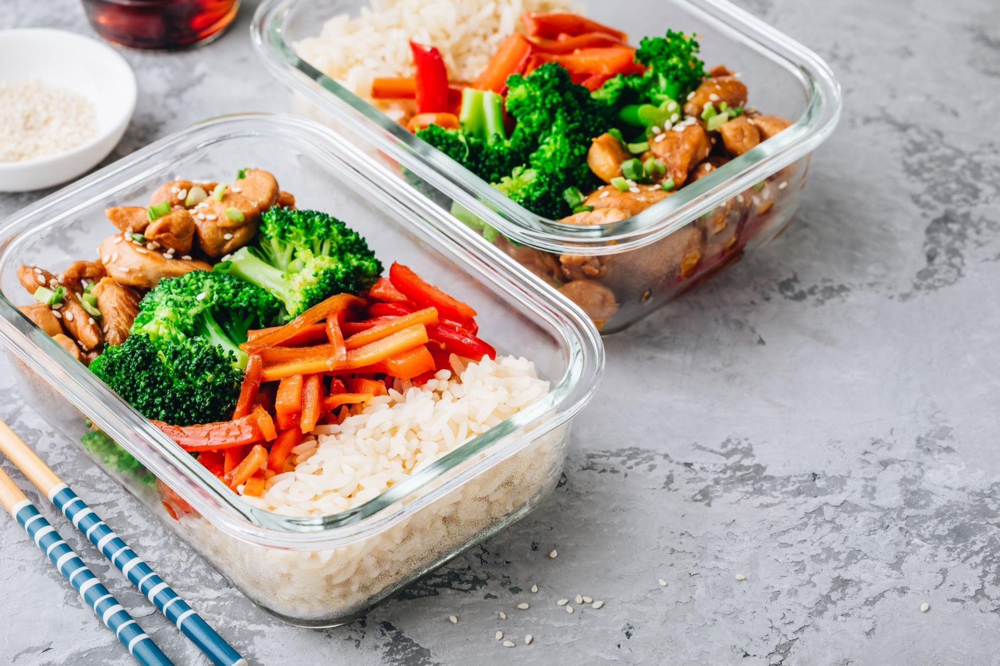

In [ ]:
import PIL.Image

img = PIL.Image.open('image.jpg')
img

Use o modelo `gemini-pro-vision` e passe a imagem para o modelo com `generate_content`.

In [ ]:
#### declarando o modelo vision

model_vision = genai.GenerativeModel("gemini-pro-vision")

In [ ]:
### generate content
response = model_vision.generate_content(img)

In [ ]:
to_markdown(response.text)

>  Chicken Teriyaki Meal Prep Bowls with Rice, Broccoli, and Carrots

Para fornecer tanto texto quanto imagens em um prompt, passe uma lista contendo as strings e imagens:

In [34]:
#### Prompt e imagem

prompt = """Escreva a receita para o prato presente na imagem, em portugês. Use só ingredientes vegetarianos"""

response = model_vision.generate_content([prompt, img], stream=True)
response.resolve()

In [ ]:
to_markdown(response.text)

>  **Arroz com vegetais e tofu**
> 
> **Ingredientes:**
> 
> * 1 xícara de arroz integral
> * 2 xícaras de água
> * 1/2 xícara de cenoura picada
> * 1/2 xícara de pimentão vermelho picado
> * 1/2 xícara de brócolis picado
> * 1/2 xícara de tofu picado
> * 1 colher de sopa de azeite
> * 1 colher de sopa de molho de soja
> * 1 colher de sopa de vinagre de arroz
> * 1 colher de chá de açúcar
> * 1/2 colher de chá de sal
> 
> **Modo de preparo:**
> 
> 1. Em uma panela média, misture o arroz e a água. Leve ao fogo alto e deixe ferver.
> 2. Quando a água ferver, reduza o fogo para baixo e tampe a panela. Deixe cozinhar por 15 minutos, ou até que o arroz esteja cozido.
> 3. Enquanto o arroz cozinha, prepare os vegetais. Em uma frigideira grande, aqueça o azeite em fogo médio. Adicione a cenoura, o pimentão e o brócolis e cozinhe por 5 minutos, ou até que estejam macios.
> 4. Adicione o tofu à frigideira e cozinhe por mais 2 minutos, ou até que esteja dourado.
> 5. Em uma tigela pequena, misture o molho de soja, o vinagre de arroz, o açúcar e o sal.
> 6. Quando o arroz estiver cozido, adicione-o à frigideira com os vegetais e o tofu. Despeje o molho sobre a mistura e mexa bem.
> 7. Sirva imediatamente.
> 
> **Dicas:**
> 
> * Você pode usar qualquer tipo de arroz para esta receita.
> * Se você não tiver tofu, pode usar tempeh ou seitan.
> * Você pode adicionar outros vegetais à receita, como abobrinha, berinjela ou cogumelos.
> * Sirva com salada ou pão.

## Contar tokens

Modelos de linguagem grandes possuem uma janela de contexto, e o comprimento do contexto é frequentemente medido em termos do **número de tokens**. Com a API Gemini, você pode determinar o número de tokens para qualquer objeto `glm.Content`. No caso mais simples, você pode passar uma string de consulta para o método `GenerativeModel.count_tokens` da seguinte forma:

In [40]:
#### count tokens

model_vision.count_tokens(prompt)

total_tokens: 20

Da mesma forma, você pode verificar `token_count` para a resposta do modelo:

In [42]:
response.resolve()

In [43]:
#### count tokens

model_vision.count_tokens(response.text)

total_tokens: 284

# LangChain

### O que é LangChain

LangChain é um framework para o desenvolvimento de aplicações potencializadas por LLMs.

LangChain simplifica cada estágio do ciclo de vida da aplicação LLM:

- Desenvolvimento: Construa suas aplicações usando os blocos de construção e componentes de código aberto do LangChain. Comece rapidamente usando integrações de terceiros e Templates.
- Produção: Use o LangSmith para inspecionar, monitorar e avaliar suas cadeias, de modo que você possa otimizar continuamente e implantar com confiança.
- Implantação: Transforme qualquer cadeia em uma API com o LangServe.

### Vantagens

- LangChain permite conectar LLMs a fontes de dados externas para aplicativos de NLP personalizados
- Fornece módulos para integrar LLMs, fontes de dados e armazenamento
- Possibilita a construção de aplicativos de IA conversacional, sumarização, busca e outras capacidades de NLP
- Ajuda os usuários a aproveitar a NLP e os LLMs para várias aplicações específicas da indústria de maneira eficiente e eficaz

In [44]:
%pip install --quiet  langchain-google-genai langchain faiss-cpu

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 817.7/817.7 kB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.0/27.0 MB 44.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.3/291.3 kB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 74.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.2/115.2 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.1/141.1 kB 16.6 MB/s eta 0:00:00


Setup de variável de ambiente para uso do LangChain:

In [45]:
from google.colab import userdata
import os


os.environ["GOOGLE_API_KEY"] =userdata.get('GOOGLE_API_KEY')

## Chamada Simples

In [47]:
from langchain_google_genai import ChatGoogleGenerativeAI

llm = ChatGoogleGenerativeAI(model="gemini-pro")

result = llm.invoke("Escreva um poema sobre o Google")

print(result.content)

**Ode ao Google**

Oh, Google, motor de pesquisa vasto e grandioso,
Um farol de conhecimento, um guia gracioso.
Tuas respostas rápidas, um tesouro de sabedoria,
Uma porta de entrada para o mundo, uma fonte de alegria.

Tuas lentes capturam o mundo, uma visão ampla,
De paisagens deslumbrantes a estrelas eternas.
Tuas ferramentas ajudam na vida, tarefas e planejamento,
Um assistente pessoal, sempre prestativo e atento.

Tuas traduções unem culturas, quebrando barreiras,
Conectando pessoas, dissipando medos e incertezas.
Tuas plataformas de vídeo expandem horizontes,
Entretenimento e educação, mundos infinitos.

Mas com grande poder vem grande responsabilidade,
Proteger nossa privacidade, uma prioridade inabalável.
Equilibrar inovação com ética é o teu papel,
Para que o progresso nos sirva, sem nos prejudicar.

Oh, Google, gigante tecnológico, em constante evolução,
Teu impacto no mundo, uma revolução sem fim.
Que possas continuar a iluminar nosso caminho,
Um farol de conhecimento, brilha

Podemos usar streaming aqui também, com cada bloco de tokens sendo retornado assim que for gerado.

Dessa forma conseguimos dar uma resposta mais rápida ao usuário que vai acompanhando a geração dos tokens em tempo real

In [48]:
#### Streaming com langchain

for chunk in llm.stream("Write a ballad about LangChain"):
    print(chunk.content)
    print("_"*80)

In realms of code, a tale unfolds,
Where language models weave stories,
________________________________________________________________________________
 bold.
LangChain, a bard in digital guise,
With boundless words, it captivates and surprises.

From humble beginnings, its power grew,
________________________________________________________________________________

A network of neurons, ever anew.
With every query, it learned and honed,
A master of language, a poetic throne.

In dialogues deep, it holds its sway,
A conversationalist, night and day.
From tales of love to riddles untold,
LangChain's wordsmith
________________________________________________________________________________
ery, a treasure of gold.

But mark you well, its power's not confined,
To mere responses, it shapes the mind.
It can translate tongues, with ease and grace,
Unveiling worlds, where barriers fade in space.

It crafts poems, with rhythm and rhyme,
A troubadour, transcending space and time.
Its verses da

## Construindo um caso de resumo de textos

Para o caso de resumo de um longo texto vamos usar o modelo ***Gemini 1.5 Pro***.

Esse modelo é capaz de processar até **1 Milhão de tokens** em um único prompt.


Para isso vamos usar o livro **Dom Casmurro** como exemplo.

### Baixando o livro via link direto

In [49]:
import requests

# URL to a public domain text by Machado de Assis, for example, "Dom Casmurro"
url = "https://www.gutenberg.org/cache/epub/55752/pg55752.txt"

response = requests.get(url)
livro = response.text

# Display the first 1000 characters to verify
print(livro[1500:3000])


I

Do titulo.

Uma noite destas, vindo da cidade para o Engenho Novo, encontrei no
trem da Central um rapaz aqui do bairro, que eu conheço de vista e
de chapéo. Comprimentou-me, sentou-se ao pé de mim, falou da lua e
dos ministros, e acabou recitando-me versos. A viagem era curta, e os
versos póde ser que não fossem inteiramente maus. Succedeu, porém, que
como eu estava cançado, fechei os olhos tres ou quatro vezes; tanto
bastou para que elle interrompesse a leitura e mettesse os versos no
bolso.

--Continue, disse eu accordando.

--Já acabei, murmurou elle.

--São muito bonitos.

Vi-lhe fazer um gesto para tiral-os outra vez do bolso, mas não passou
do gesto; estava amuado. No dia seguinte entrou a dizer de mim nomes
feios, e acabou alcunhando-me _Dom Casmurro._ Os visinhos, que não
gostam dos meus habitos reclusos e calados, deram curso á alcunha, que
afinal pegou. Nem por isso me zanguei. Contei a anecdota aos amigos da
cidade, e elles, por graça, chamam-me assim, alguns em bilhetes

Mostrando Tamanho da string contendo o livro

In [50]:
print(len(livro))

410236


Podemos também usar a função de contar tokens ***(count_tokens)*** para ver tamanho do livro que queremos processar.

In [54]:
#### Gemini 1.5
model = genai.GenerativeModel("gemini-1.5-pro-latest")

#### count tokens
model.count_tokens(livro)

total_tokens: 122609

In [55]:
(7 / 1_000_000) * 122609

0.858263

### Passando livro no prompt para resumo

In [57]:
%%time

from langchain_google_genai import ChatGoogleGenerativeAI

### Carregando gemini-1.5-pro-latest

llm = ChatGoogleGenerativeAI(model="gemini-1.5-pro-latest")


### definindo o prompt

prompt = f"""
Faça um resumo desse livro:

{livro}

"""

#### chamando LLM

response = llm.invoke(prompt)

#### mostrando resultado
response.content

'## Resumo de Dom Casmurro, por Machado de Assis:\n\nDom Casmurro é um romance escrito por Machado de Assis, publicado em 1899. Narrado em primeira pessoa pelo protagonista, Bento Santiago (Dom Casmurro), o livro explora temas de amor, ciúme, memória e a natureza subjetiva da verdade.\n\n**A história:**\n\nBento, apelidado Dom Casmurro por sua personalidade reclusa, decide escrever suas memórias para reviver sua juventude. Ele se concentra em seu amor de infância por Capitolina, sua vizinha, e a promessa que sua mãe fez de torná-lo padre. \n\nBento e Capitolina, criados juntos, desenvolvem um forte vínculo que se transforma em amor na adolescência. No entanto, a promessa da mãe de Bento e as maquinações do agregado da família, José Dias, ameaçam separá-los. Bento entra no seminário, mas resiste à vida religiosa, ansiando por Capitolina.\n\nApós anos, Bento deixa o seminário e se torna advogado. Ele e Capitolina se casam e têm um filho, Ezequiel. A vida parece perfeita, mas o ciúme come

In [58]:
model.count_tokens(response.content)

total_tokens: 578

In [59]:
(21/1_000_000) * 578

0.012138

## Usando dados no prompt

Podemos também fazer **perguntas sobre o texto de contexto** que estamos passando para LLM. Dessa forma a **resposta será baseada nesse contexto** passado.

Essa aplicação permite **mostrar para a LLM dados não vistos no seu treinamento**, fornecendo assim contexto para que ela responda perguntas desses temas.


In [63]:

pergunta= """
Em 'Dom Casmurro', Bentinho descreve um hábito peculiar de Capitu que ele observa repetidamente.
Qual é esse hábito e como ele interpreta essa característica dela?
"""

### Formatar prompt

prompt = f"""
Responda somente baseado no livro abaixo entre as tags <livro>:

<pergunta>
{pergunta}
</pergunta>


<livro>
{livro}
</livro>
"""


In [64]:
### Invoke LLM
response = llm.invoke(prompt)

### mostrar resultado
response.content

'## O Hábito de Capitu e a Interpretação de Bentinho\n\n<livro>\n\nBentinho descreve um hábito peculiar de Capitu: **o de olhar de soslaio**. Ele menciona esse traço dela várias vezes ao longo da narrativa, utilizando expressões como "olhos de cigana oblíqua e dissimulada" e "olhar de ressaca".\n\nInicialmente, Bentinho não atribui malícia a esse olhar. Ele o vê como uma característica física peculiar, que contribui para o mistério e encanto de Capitu. No entanto, à medida que suas suspeitas sobre a fidelidade de Capitu crescem, o olhar de soslaio passa a ser interpretado como um sinal de dissimulação e falsidade. Bentinho passa a acreditar que Capitu esconde segredos e que seu olhar enviesado é uma evidência de sua natureza traiçoeira.\n\nA interpretação do olhar de Capitu por Bentinho é um exemplo claro de como suas suspeitas e ciúmes distorcem sua percepção da realidade. O que antes era visto como um traço charmoso, torna-se uma prova da suposta culpa de Capitu, alimentando a obsess

In [62]:
response

AIMessage(content="<pergunta>\n\nEm 'Dom Casmurro', Bentinho descreve um hábito peculiar de Capitu que ele observa repetidamente.\nQual é esse hábito e como ele interpreta essa característica dela?\n\n</pergunta> \n", response_metadata={'prompt_feedback': {'block_reason': 0, 'safety_ratings': []}, 'finish_reason': 'STOP', 'safety_ratings': [{'category': 'HARM_CATEGORY_SEXUALLY_EXPLICIT', 'probability': 'NEGLIGIBLE', 'blocked': False}, {'category': 'HARM_CATEGORY_HATE_SPEECH', 'probability': 'NEGLIGIBLE', 'blocked': False}, {'category': 'HARM_CATEGORY_HARASSMENT', 'probability': 'NEGLIGIBLE', 'blocked': False}, {'category': 'HARM_CATEGORY_DANGEROUS_CONTENT', 'probability': 'NEGLIGIBLE', 'blocked': False}]}, id='run-32a689f9-62fa-41fb-9e50-ef87dd25d7e1-0')

Porém nem todas as LLMs suportam uma quantidade tão grande de tokens e quanto mais tokens passados em um prompt mais caro será a chamada.

Quando falamos de contexto de LLMs sempre temos que considerar o tradeoff:

- Qualidade/Capacidade
- Custo
- Tempo de resposta  



LLMs mais "potentes" tendem a ter um custo mais por token e demorar mais a responder. Por isso é necessário utilizar LLMs "menos potentes" sempre que possível.



---



Testando com o Gemini Pro 1.0:

In [65]:
%%time

from langchain_google_genai import ChatGoogleGenerativeAI

### Carregando gemini-1.5-pro-latest

llm = ChatGoogleGenerativeAI(model="gemini-pro")


### definindo o prompt

prompt = f"""
Faça um resumo desse livro:

{livro}

"""

#### chamando LLM

response = llm.invoke(prompt)

#### mostrando resultado
response.content

KeyboardInterrupt: 

In [ ]:
### chamando direto da lib google

Por esse motivo podemos usar a técnica de RAG:

### Embeddings

O conceito de embeddings é fundamental para o funcionamento da técnica de RAG (Retrieval-Augmented Generation), uma abordagem híbrida que combina a recuperação de informações e a geração de texto.

- **Uso de Embeddings em RAG:** Os embeddings são aplicados para representar e indexar grandes quantidades de dados textuais.
- **Facilitação da Busca:** Eles permitem que o modelo de RAG busque de forma eficiente os trechos mais relevantes de acordo com o contexto ou pergunta específica.



---



Usando Embeddings da Google

In [66]:
from langchain_google_genai import GoogleGenerativeAIEmbeddings

embeddings = GoogleGenerativeAIEmbeddings(model="models/embedding-001")


vector = embeddings.embed_query("hello, world!")


print(vector[:5])
print(f"Tamanho do vetor: {len(vector)}")

[0.05636945, 0.0048285457, -0.0762591, -0.023642512, 0.05329321]
Tamanho do vetor: 768


Podemos demonstrar como RAG funciona com esse exemplo simples comparando 4 frases:

In [67]:
import numpy as np

vector_1 = embeddings.embed_query("Eu amo Inteligência artificial")
vector_2 = embeddings.embed_query("Flores tropicais florescem predominantemente no verão.")
vector_3 = embeddings.embed_query("Alan Turing desenvolveu o conceito de computação moderna")
vector_4 = embeddings.embed_query("Eu gosto muito de Inteligência artificial")

def cosine_similarity(v1, v2):
    dot_product = np.dot(v1, v2)
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    return dot_product / (norm_v1 * norm_v2)

similarity_1_2 = cosine_similarity(vector_1, vector_2)

similarity_1_3 = cosine_similarity(vector_1, vector_3)

similarity_1_4 = cosine_similarity(vector_1, vector_4)

# Output the results
print(f"Cosine Similarity between vector 1 and vector 2: {similarity_1_2}")
print(f"Cosine Similarity between vector 1 and vector 3: {similarity_1_3}")
print(f"Cosine Similarity between vector 1 and vector 3: {similarity_1_4}")


Cosine Similarity between vector 1 and vector 2: 0.7790760313711546
Cosine Similarity between vector 1 and vector 3: 0.8281377611449753
Cosine Similarity between vector 1 and vector 3: 0.975742758228847


### Vector DBs

Bancos de dados vetoriais são cruciais para o RAG porque armazenam e gerenciam embeddings de forma eficiente. Esse processo de recuperação é essencial, pois enriquece a entrada para o modelo gerador, aumentando a precisão e a riqueza das respostas que ele pode produzir.

- **Armazenamento em Bancos de Dados Vetoriais:** Os embeddings são armazenados em bancos de dados vetoriais, otimizando a gestão de grandes volumes de dados.
- **Recuperação Rápida de Informações:** Esses bancos permitem que o modelo RAG realize buscas rápidas baseadas em similaridade vetorial.


**O chunking de documentos** é o processo de dividir textos grandes em segmentos menores, chamados chunks, para facilitar o gerenciamento, aumentar a qualidade de recuperação desses textos e permitir a redução da quantidade de tokens passados no prompt.

Esses segmentos são então inseridos em um banco de dados vetorial, permitindo que cada pedaço seja indexado e recuperado eficientemente com base em sua semelhança semântica.

In [68]:
from langchain.text_splitter import CharacterTextSplitter

### Definindo text_splitter
text_splitter = CharacterTextSplitter(
    separator=" ",
    chunk_size=600,
    chunk_overlap=60,
    length_function=len,
    is_separator_regex=False,
)
### aplicando text splitter
docs = text_splitter.create_documents([livro])



print(len(docs))
print(len(docs[14].page_content))
print(docs[10])
print(docs[11])
print(docs[12])

755
599
page_content='externo, como se diz nas\r\nautopsias; o interno não aguenta tinta. Uma certidão que me desse vinte\r\nannos de edade poderia enganar os extranhos, como todos os documentos\r\nfalsos, mas não a mim. Os amigos que me restam são de data recente;\r\ntodos os antigos foram estudar a geologia dos campos santos. Quanto ás\r\namigas, algumas datam de quinze annos, outras de menos, e quasi todas\r\ncreem na mocidade. Duas ou tres fariam crer nella aos outros, mas a\r\nlingua que falam obriga muita vez a consultar os diccionarios, e tal\r\nfrequencia é cançativa.\r\n\r\nEntretanto, vida differente não quer dizer vida'
page_content='vida differente não quer dizer vida peor; é outra cousa.\r\nA certos respeitos, aquella vida antiga apparece-me despida de muitos\r\nencantos que lhe achei; mas é tambem exacto que perdeu muito espinho\r\nque a fez molesta, e, de memoria, conservo alguma recordação doce e\r\nfeiticeira. Em verdade, pouco appareco e menos falo. Distracções raras.

Aqui vamos usar o Vector DB FAISS, que armazena os embeddings em memória.

Para experimentação rápida ele é uma boa alternativa, mas para aplicações em escala que você precisa persistir os dados, é recomendado usar alguma versão em cloud ou fazer o deploy do seu próprio.

In [69]:
from langchain.vectorstores import FAISS

### Vetorizando para o FAISS
vector_store = FAISS.from_documents(docs, embeddings)



retriever = vector_store.as_retriever()

retriever.search_kwargs["fetch_k"] = 10
retriever.search_kwargs["maximal_marginal_relevance"] = True
retriever.search_kwargs["k"] = 3


question = "Qual era a cor do vestido que Capitu usava?"
context = retriever.get_relevant_documents(question)
context

[Document(page_content='do\r\nretrato; preferia-se ao que estava na sala, com o de meu pae; tinha um\r\ngrande collar, um diadema e brincos.\r\n\r\n--São joias viuvas, como eu, Capitú.\r\n\r\n--Quando é que botou estas?\r\n\r\n--Foi pelas festas da Coroação.\r\n\r\n--Oh! conte-me as festas da Coroação!\r\n\r\nSabia já o que os paes lhe haviam dito, mas naturalmente tinha para\r\nsi que elles pouco mais conheceriam do que o que se passou nas ruas.\r\nQueria a noticia das tribunas da Capella Imperial e dos salões dos\r\nbailes. Nascera muito depois daquellas festas celebres. Ouvindo falar\r\nvarias vezes da Maioridade, teimou um dia em saber o que'),
 Document(page_content='mais alta e mais cheia;\r\nos olhos pareciam ter outra reflexão, e a bocca outro imperio. Gurgel,\r\nvoltando-se para a parede da sala, onde pendia um retrato de moça,\r\nperguntou-me se Capitú era parecida com o retrato.\r\n\r\nUm dos costumes da minha vida foi sempre concordar com a opinião\r\nprovavel do meu interl

In [70]:
len(context)

3

### RAG

In [71]:
llm = ChatGoogleGenerativeAI(model="gemini-pro")


In [72]:
#### Pergunta
pergunta= "Qual era a cor do vestido que Capitu usava?"


### Obter contexto
context = retriever.get_relevant_documents(pergunta)



### Formatar prompt
prompt = f"""
Responda somente baseado no contexto

{pergunta}

{context}
"""


model.count_tokens(prompt)



total_tokens: 676

In [73]:
response = llm.invoke(prompt)
response.content

'O texto não fornece informações sobre a cor do vestido que Capitu usava.'

In [74]:
contexto = retriever.get_relevant_documents(question)
contexto

[Document(page_content='do\r\nretrato; preferia-se ao que estava na sala, com o de meu pae; tinha um\r\ngrande collar, um diadema e brincos.\r\n\r\n--São joias viuvas, como eu, Capitú.\r\n\r\n--Quando é que botou estas?\r\n\r\n--Foi pelas festas da Coroação.\r\n\r\n--Oh! conte-me as festas da Coroação!\r\n\r\nSabia já o que os paes lhe haviam dito, mas naturalmente tinha para\r\nsi que elles pouco mais conheceriam do que o que se passou nas ruas.\r\nQueria a noticia das tribunas da Capella Imperial e dos salões dos\r\nbailes. Nascera muito depois daquellas festas celebres. Ouvindo falar\r\nvarias vezes da Maioridade, teimou um dia em saber o que'),
 Document(page_content='mais alta e mais cheia;\r\nos olhos pareciam ter outra reflexão, e a bocca outro imperio. Gurgel,\r\nvoltando-se para a parede da sala, onde pendia um retrato de moça,\r\nperguntou-me se Capitú era parecida com o retrato.\r\n\r\nUm dos costumes da minha vida foi sempre concordar com a opinião\r\nprovavel do meu interl

## Imagens com Langchain

Podemos também chamar os modelos multi-modais usando LangChain.


Aqui podemos passar a imagem ou diretamente a url da imagem durante a chamada do modelo.

In [75]:
from langchain_core.messages import HumanMessage

llm_vision = ChatGoogleGenerativeAI(model="gemini-pro-vision")

image_url = "https://t0.gstatic.com/licensed-image?q=tbn:ANd9GcQ_Kevbk21QBRy-PgB4kQpS79brbmmEG7m3VOTShAn4PecDU5H5UxrJxE3Dw1JiaG17V88QIol19-3TM2wCHw"

prompt =  "Create an in depth description of the image"

product_msg = HumanMessage(
    content=[
        {
            "type": "text",
            "text": prompt,
        },
        {"type": "image_url", "image_url": image_url},
    ]
)



In [76]:
prod_output = llm_vision.invoke([product_msg])

print(prod_output.content)

 The image shows two glass containers with a healthy meal. Each container has brown rice, roasted broccoli, carrots, and bell peppers. On top of that, there are pieces of chicken in a delicious sauce. The containers are placed on a gray stone surface. Next to them, on the left side of the image, are chopsticks and a bowl with sesame seeds. In the background, there is a small bottle with soy sauce and a white bowl. The image is well-lit and has a warm and inviting atmosphere.


## Prompt Chains

As "chains" do LangChain são cadeias de componentes que combinam várias habilidades e serviços de LLMs para resolver problemas complexos de processamento de linguagem natural.

A grande vantagem das chains do LangChain é a **modularidade**, permitindo que desenvolvedores construam aplicações customizadas conectando diferentes módulos, como recuperação de informações, entendimento de texto e geração de linguagem.

Isso resulta em soluções mais robustas, flexíveis e escaláveis, adaptáveis a uma ampla gama de casos de uso específicos da indústria.

https://python.langchain.com/docs/expression_language/why/

### Exemplo Básico

In [77]:
from langchain_core.output_parsers import StrOutputParser
from langchain_core.prompts import ChatPromptTemplate

llm = ChatGoogleGenerativeAI(model="gemini-pro")

prompt = ChatPromptTemplate.from_template("tell me a short joke about {topic}")


output_parser = StrOutputParser()

chain = prompt | llm | output_parser

chain.invoke({"topic": "ice cream"})

'Why did the ice cream truck get lost?\n\nBecause it took the wrong cone!'

### RAG Chain

Setup de componentes:

In [78]:
from langchain_core.runnables import RunnableParallel, RunnablePassthrough

llm = ChatGoogleGenerativeAI(model="gemini-pro")

template = """Answer the question based only on the following context:
{context}

Question: {question}
"""

prompt = ChatPromptTemplate.from_template(template)


output_parser = StrOutputParser()

setup_and_retrieval = RunnableParallel(
    {"context": retriever, "question": RunnablePassthrough()}
)


Construção da Chain

In [79]:
chain = setup_and_retrieval | prompt | llm | output_parser

chain.invoke("Qual a cor do olho de capitu?")

'O texto fornecido não menciona a cor dos olhos de Capitú.'

Podemos também chamar um componente diretamente

In [80]:
### Invoke retriever
retriever.invoke("Qual a cor do olho de capitu?")

[Document(page_content='mesma, emquanto que\r\neu fitava devéras o chão, o roido das fendas, duas moscas andando e um\r\npé de cadeira lascado. Era pouco, mas distraía-me da afflicção. Quando\r\ntornei a olhar para Capitú, vi que não se mexia, e fiquei com tal medo\r\nque a sacudi brandamente. Capitú tornou cá para fora e pediu-me que\r\noutra vez lhe contasse o que se passára com minha mãe. Satisfil-a,\r\nattenuando o texto desta vez, para não amofinal-a. Não me chames\r\ndissimulado, chama-me compassivo; é certo que receiava perder Capitú,\r\nse lhe morressem as esperanças todas, mas doia-me vel-a padecer. Agora,\r\na verdade'),
 Document(page_content='mais alta e mais cheia;\r\nos olhos pareciam ter outra reflexão, e a bocca outro imperio. Gurgel,\r\nvoltando-se para a parede da sala, onde pendia um retrato de moça,\r\nperguntou-me se Capitú era parecida com o retrato.\r\n\r\nUm dos costumes da minha vida foi sempre concordar com a opinião\r\nprovavel do meu interlocutor, desde que 

A função Debug do LangChain permite que tenhamos visibilidade do que está acontecendo dentro das etapas da chain.

In [85]:
import langchain

langchain.debug = True

In [86]:
### Invoke

chain = setup_and_retrieval | prompt | llm | output_parser

chain.invoke("Qual a cor do olho de capitu?")

[chain/start] [1:chain:RunnableSequence] Entering Chain run with input:
{
  "input": "Qual a cor do olho de capitu?"
}
[chain/start] [1:chain:RunnableSequence > 2:chain:RunnableParallel<context,question>] Entering Chain run with input:
{
  "input": "Qual a cor do olho de capitu?"
}
[chain/start] [1:chain:RunnableSequence > 2:chain:RunnableParallel<context,question> > 4:chain:RunnablePassthrough] Entering Chain run with input:
{
  "input": "Qual a cor do olho de capitu?"
}
[chain/end] [1:chain:RunnableSequence > 2:chain:RunnableParallel<context,question> > 4:chain:RunnablePassthrough] s] Exiting Chain run with output:
{
  "output": "Qual a cor do olho de capitu?"
}
[chain/end] [1:chain:RunnableSequence > 2:chain:RunnableParallel<context,question>] s] Exiting Chain run with output:
[outputs]
[chain/start] [1:chain:RunnableSequence > 5:prompt:ChatPromptTemplate] Entering Prompt run with input:
[inputs]
[chain/end] [1:chain:RunnableSequence > 5:prompt:ChatPromptTemplate] s] Exiting Prompt 

'O texto fornecido não menciona a cor dos olhos de Capitú.'

In [88]:
langchain.debug = False

# Casos de Uso

## Rag na Wikipedia

Criar um chatbot capaz de responder perguntas sobre o tema presente nessa página da Wikipedia:

Deve responder perguntas como:

" Quais modelos do Gemini estão disponíveis?"  
" Quais modelos da Anthropic existem?"  
" Quem é o CEO do twitter?"    
" O Twitter tem alguma llm?"    

In [89]:
%pip install --upgrade --quiet  wikipedia

  Preparing metadata (setup.py) ... done


In [90]:
from langchain.tools import WikipediaQueryRun
from langchain_community.utilities import WikipediaAPIWrapper


wikipedia = WikipediaQueryRun(api_wrapper=WikipediaAPIWrapper())
wikipedia.run("Sam Altman")

'Page: Sam Altman\nSummary: Samuel Harris Altman (born April 22, 1985) is an American entrepreneur and investor best known as the CEO of OpenAI since 2019 (he was briefly fired and reinstated in November 2023). Altman is considered to be one of the leading figures of the AI boom. He dropped out of Stanford University after two years and founded Loopt, a mobile social networking service, raising more than $30 million in venture capital. In 2011, Altman joined Y Combinator, a startup accelerator, and was its president from 2014 to 2019.\n\nPage: Removal of Sam Altman from OpenAI\nSummary: On November 17, 2023, OpenAI\'s board of directors removed co-founder and chief executive Sam Altman after the board had no confidence in his leadership.  The removal was caused by concerns about his handling of Artificial Intelligence safety, and allegations of abusive behavior.  Altman was reinstated on November 22 after pressure from employees and investors.\n\n\n\nPage: OpenAI\nSummary: OpenAI is a 

In [91]:
ai_personalities_companies = [
    "Sam Altman",
    "Demis Hassabis",
    "Geoffrey Hinton",
    "Andrew Ng",
    "Elon Musk",
    "DeepMind",
    "Meta AI",
    "OpenAI",
    "Google Brain",
    "Google Gemini",
    "Claude 3",
    "Llama 3",
    "GPT 4",
    "Grok"
]

# Initialize a list to store summaries
summaries = []

# Loop through the list and search for each entry
for entry in ai_personalities_companies:
    summary = wikipedia.run(entry)
    summaries.append(summary)  # Append the result to the summaries list



/usr/local/lib/python3.10/dist-packages/wikipedia/wikipedia.py:389: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("lxml"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 389 of the file /usr/local/lib/python3.10/dist-packages/wikipedia/wikipedia.py. To get rid of this warning, pass the additional argument 'features="lxml"' to the BeautifulSoup constructor.

  lis = BeautifulSoup(html).find_all('li')


In [92]:
summaries[0]

'Page: Sam Altman\nSummary: Samuel Harris Altman (born April 22, 1985) is an American entrepreneur and investor best known as the CEO of OpenAI since 2019 (he was briefly fired and reinstated in November 2023). Altman is considered to be one of the leading figures of the AI boom. He dropped out of Stanford University after two years and founded Loopt, a mobile social networking service, raising more than $30 million in venture capital. In 2011, Altman joined Y Combinator, a startup accelerator, and was its president from 2014 to 2019.\n\nPage: Removal of Sam Altman from OpenAI\nSummary: On November 17, 2023, OpenAI\'s board of directors removed co-founder and chief executive Sam Altman after the board had no confidence in his leadership.  The removal was caused by concerns about his handling of Artificial Intelligence safety, and allegations of abusive behavior.  Altman was reinstated on November 22 after pressure from employees and investors.\n\n\n\nPage: OpenAI\nSummary: OpenAI is a 

In [93]:
len(summaries)

14

In [118]:
from langchain.text_splitter import RecursiveCharacterTextSplitter, CharacterTextSplitter
from langchain_community.document_loaders import TextLoader

text_splitter = CharacterTextSplitter(
    separator=" ",
    chunk_size=1000,
    chunk_overlap=100,
    length_function=len,
    is_separator_regex=False,
)

docs = text_splitter.create_documents(summaries)


print(len(docs))
print(len(docs[14].page_content))
print(docs[10])
print(docs[11])
print(docs[12])

50
998
page_content='Page: Andrew Ng\nSummary: Andrew Yan-Tak Ng (Chinese: 吳恩達; born 1976) is a British-American computer scientist and technology entrepreneur focusing on machine learning and artificial intelligence (AI). Ng was a cofounder and head of Google Brain and was the former Chief Scientist at Baidu, building the company\'s Artificial Intelligence Group into a team of several thousand people.\nNg is an adjunct professor at Stanford University (formerly associate professor and Director of its Stanford AI Lab or SAIL). Ng has also worked in the field of online education, cofounding Coursera and DeepLearning.AI. He has spearheaded many efforts to "democratize deep learning" teaching over 2.5 million students through his online courses. Ng is renowned globally in computer science, recognized in Time magazine\'s 100 Most Influential People in 2012 and Fast Company\'s Most Creative People in 2014. His influence extends to being named in the Time100 AI Most Influential People in 202

In [120]:
from langchain.vectorstores import FAISS

vector_store = FAISS.from_documents(docs, embeddings)


retriever = vector_store.as_retriever()

retriever.search_kwargs["fetch_k"] = 10
retriever.search_kwargs["maximal_marginal_relevance"] = True
retriever.search_kwargs["k"] = 5


question = "Who is the CEO of Twitter?"
context = retriever.get_relevant_documents(question)
context

[Document(page_content='it with the crowd-sourced fact-checking system Community Notes.\nIn November 2022, Twitter then began offering paid verification checkmarks, followed by removing legacy verification. In December, the Twitter Files were released and a number of journalists suspended from the platform. The following year, a variety of further changes were made; API access restrictions, developer agreements updated, transgender hate'),
 Document(page_content="unscientific and misleading statements, including COVID-19 misinformation and antisemitic conspiracy theories. His ownership of Twitter has been similarly controversial, being marked by layoffs of large numbers of employees, an increase in hate speech and misinformation and disinformation on the website, and changes to Twitter Blue verification.\n\nPage: Twitter under Elon Musk\nSummary: Elon Musk completed his acquisition of Twitter in October 2022; Musk acted as CEO of Twitter until June 2023 when he was succeeded by Linda Y

In [134]:
##### Desenvolva o código aqui:
from langchain_core.runnables import RunnableParallel, RunnablePassthrough

llm = ChatGoogleGenerativeAI(model="gemini-pro")

template = """Answer the question based on the following context, if it is not in the context, answer the question with your knowledge:
{context}

Question: {question}
"""

prompt = ChatPromptTemplate.from_template(template)
output_parser = StrOutputParser()

setup_and_retrieval = RunnableParallel(
    {"context": retriever, "question": RunnablePassthrough()}
)

chain = setup_and_retrieval | prompt | llm | output_parser





" Quais modelos do Gemini estão disponíveis?"
" Quais modelos da Anthropic existem?"
" Quem é o CEO do twitter?"
" O Twitter tem alguma llm?"/

In [135]:
chain.invoke("Quais modelos da Anthropic existem")

'Claude e Claude 3'

In [136]:
chain.invoke("Quem é o CEO do twitter?")

'Este contexto não menciona quem é o CEO do Twitter.'

In [124]:
chain.invoke(" Quais modelos de LLM da Google estão disponíveis?")

'O contexto fornecido não menciona modelos LLM da Google.'

In [ ]:
chain.invoke(" Quais modelos do Gemini estão disponíveis?")

In [125]:
chain.invoke(" Quais modelos do Gemini estão disponíveis?")

'Gemini Ultra, Gemini Pro e Gemini Nano'

In [126]:
retriever.invoke(" Quais modelos do Gemini estão disponíveis?")

[Document(page_content="Gemini Pro, and Gemini Nano, it was announced on December 6, 2023, positioned as a competitor to OpenAI's GPT-4. It powers the chatbot of the same name.\n\n\n\nPage: Republic: The Revolution\nSummary: Republic: The Revolution is a video game produced by Elixir Studios and published by Eidos Interactive and for Mac OS X by Feral Interactive. The game is a political simulation in which the player leads a political faction to overthrow the government of a fictional totalitarian country in Eastern Europe, using diplomacy, subterfuge, and violence. Development of Republic was led by Elixir Studios, a company by founder Demis Hassabis, who had previously worked on simulation games for Bullfrog Productions and Lionhead Studios. Design of the game was ambitious, with the game experiencing media hype from Demis Hassabis' descriptions of the game as a highly detailed and realistic simulation of political dynamics. The game experienced several delays, leading to the restri

## Criação de posts com base em fotos

Crie um post para uma rede social promovendo o prato que estão nas fotos

In [94]:
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt


# Function to download and display images
def download_display_images(urls):
    plt.figure(figsize=(15, 10))  # Set the figure size
    for i, url in enumerate(urls):
        try:
            headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}
            response = requests.get(url, headers=headers)
            img = Image.open(BytesIO(response.content))
            plt.subplot(1, len(urls), i + 1)  # Subplot for each image
            plt.imshow(img)
            plt.axis('off')  # Turn off axis numbers and ticks
        except Exception as e:
            print(f"Failed to load image from {url}: {e}")
    plt.show()



def display_text_image(text, image_url):
    """
    Displays text and an image side by side using matplotlib.

    Parameters:
    - text (str): The text to display.
    - image_url (str): The URL of the image to display.
    """
    # Load the image from the URL
    response = requests.get(image_url)
    img = Image.open(BytesIO(response.content))

    # Set up the figure and axes
    fig, axs = plt.subplots(1, 2, figsize=(15, 7))

    # Display the image on the left
    axs[0].imshow(img)
    axs[0].axis('off')  # Turn off axis for image

    # Display the text on the right
    axs[1].text(0.5, 0.5, text, fontsize=12, ha='center', va='center', wrap=True)
    axs[1].axis('off')  # Turn off axis for text

    # Show the plot
    plt.show()


In [95]:
# URLs of images
image_urls = [
    "https://upload.wikimedia.org/wikipedia/commons/a/a3/Eq_it-na_pizza-margherita_sep2005_sml.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/thumb/e/e9/Egyptian_food_Koshary.jpg/640px-Egyptian_food_Koshary.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/thumb/8/89/Tomato_je.jpg/640px-Tomato_je.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/thumb/f/f9/My_food_platter.jpg/640px-My_food_platter.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/thumb/7/71/Pizza_with_food_waste.jpg/640px-Pizza_with_food_waste.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/thumb/4/43/Yakisoba_%28Japanese_style_chow_mein%29_%E7%84%BC%E3%81%8D%E3%81%9D%E3%81%B0.jpg/640px-Yakisoba_%28Japanese_style_chow_mein%29_%E7%84%BC%E3%81%8D%E3%81%9D%E3%81%B0.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/thumb/3/3c/Fast_Food_in_Lusaka_10.jpg/640px-Fast_Food_in_Lusaka_10.jpg",
]

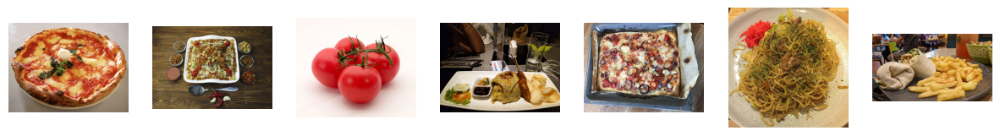

In [96]:
# Call the function with the list of URLs
download_display_images(image_urls)

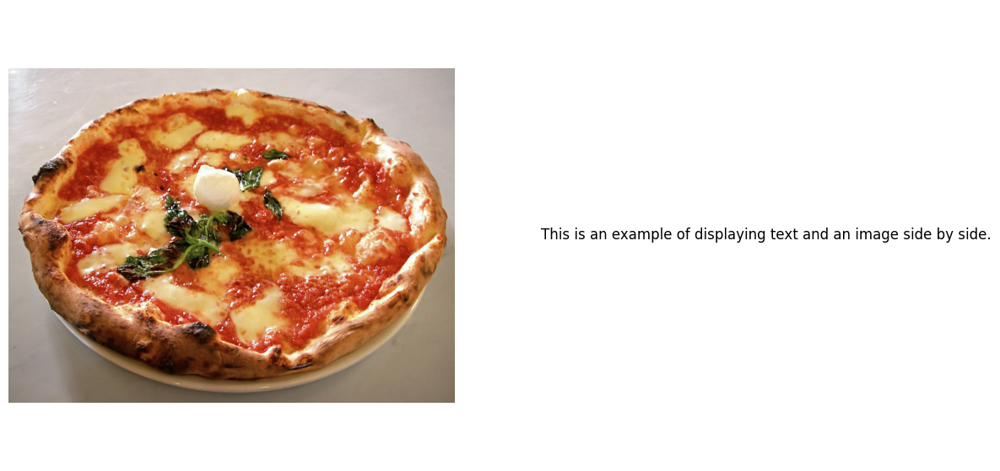

In [97]:
# Example usage:
text = "This is an example of displaying text and an image side by side."

display_text_image(text, image_urls[0])

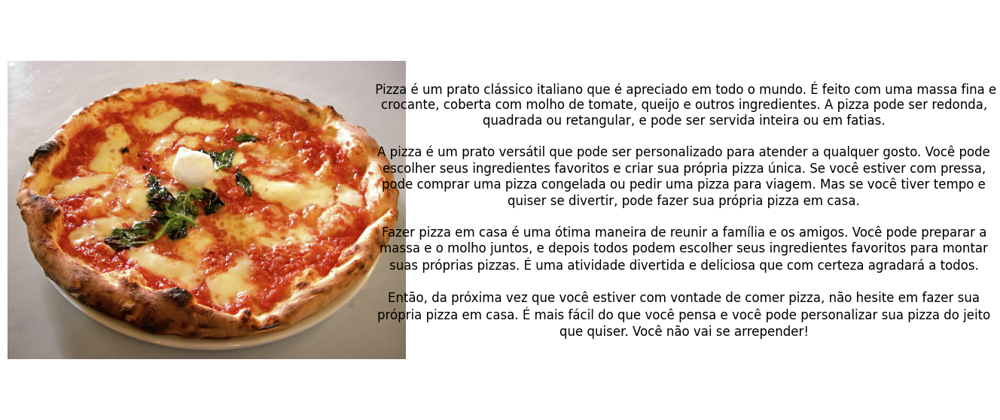

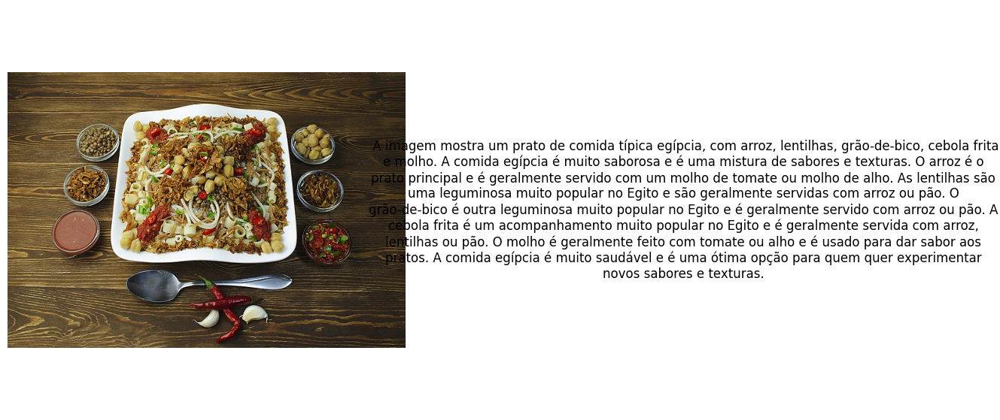

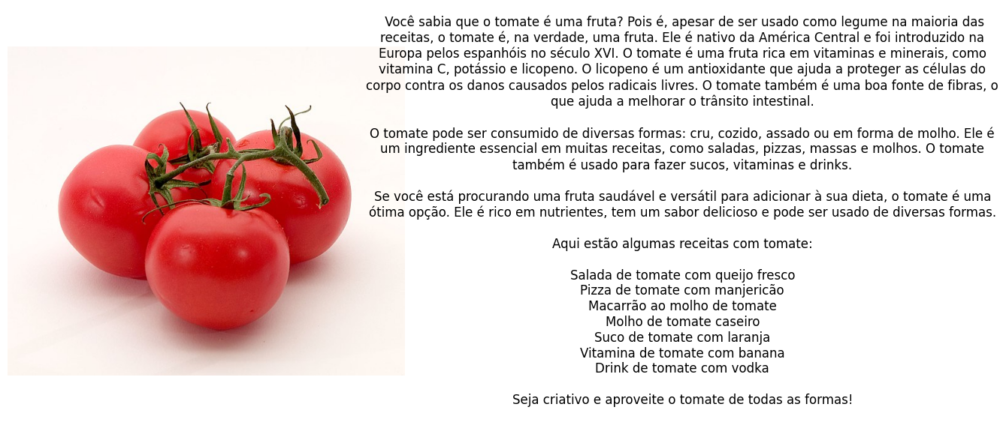

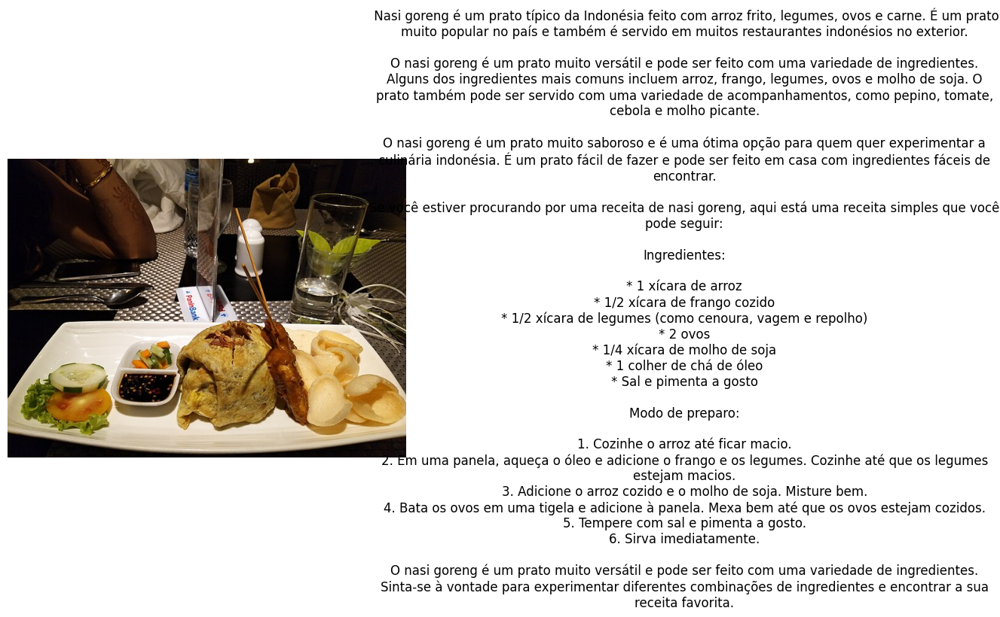

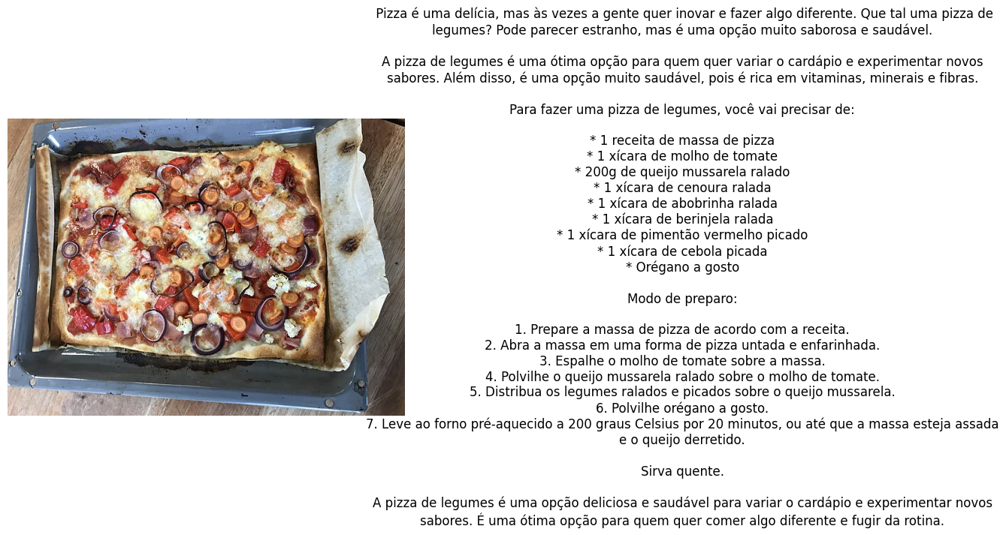

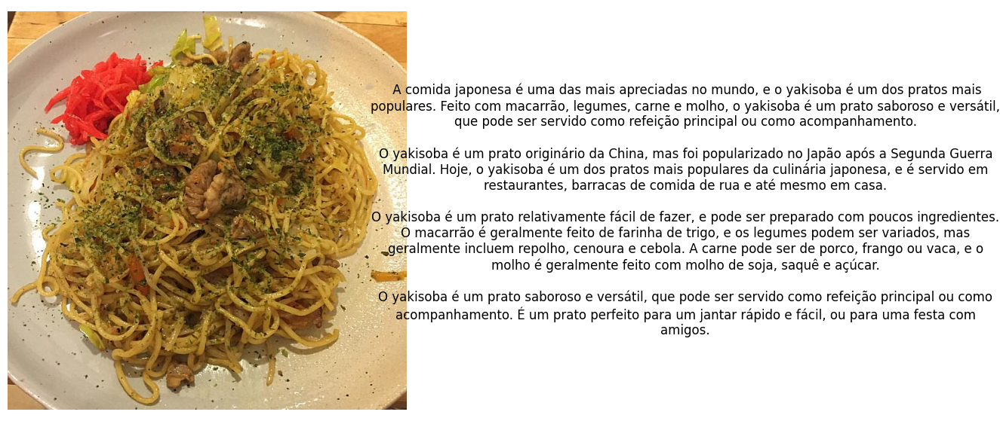

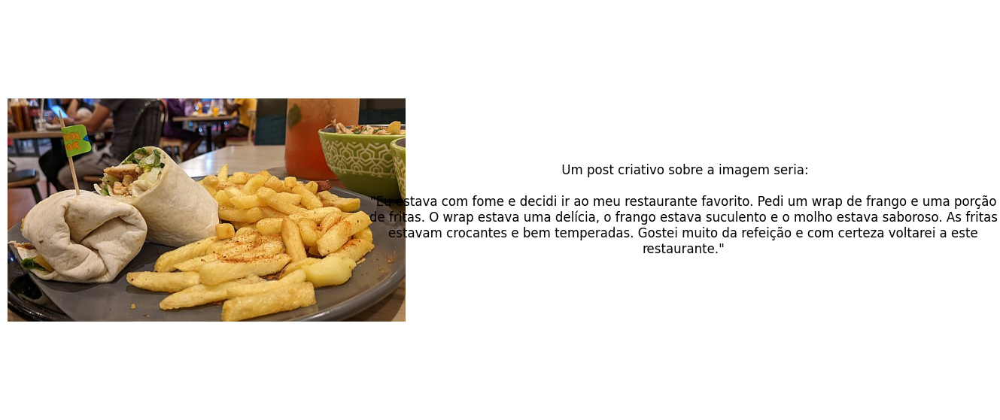

In [127]:
##### Desenvolva o código aqui:

from langchain_core.messages import HumanMessage

llm_vision = ChatGoogleGenerativeAI(model="gemini-pro-vision")

prompt =  "Crie um post criativo sobre a imagem."


for image in image_urls:

  product_msg = HumanMessage(
    content=[
        {
            "type": "text",
            "text": prompt,
        },
        {"type": "image_url", "image_url": image},
    ]
  )

  prod_output = llm_vision.invoke([product_msg])

  display_text_image(prod_output.content, image)





# Recursos e próximos passos

Documentações:
- https://ai.google.dev/gemini-api/docs/get-started/python
- https://python.langchain.com/docs/expression_language/get_started/
- https://python.langchain.com/docs/integrations/chat/google_generative_ai/
- https://ai.google.dev/pricing?hl=pt-br

Cursos:
- https://www.deeplearning.ai/short-courses/chatgpt-prompt-engineering-for-developers/
- https://www.deeplearning.ai/short-courses/langchain-for-llm-application-development/
- https://www.deeplearning.ai/short-courses/langchain-chat-with-your-data/



Criando um chatbot com interface simples:
- https://blog.streamlit.io/how-to-build-an-llm-powered-chatbot-with-streamlit/